<a href="https://www.kaggle.com/code/tarizatique/house-price-prediction?scriptVersionId=112565982" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import pandas as pd
import numpy as np
import pickle

#visualisation
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
#sns.set_style('whitegrid')

# Model
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.linear_model import ElasticNet

#perfomance
from sklearn.metrics import mean_squared_error,r2_score


Importing Dataset

In [2]:
df = pd.read_csv("/kaggle/input/usa-housing/USA_Housing.csv")


# EDA

In [3]:
df.head()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Address
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,"208 Michael Ferry Apt. 674\nLaurabury, NE 3701..."
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,"188 Johnson Views Suite 079\nLake Kathleen, CA..."
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,"9127 Elizabeth Stravenue\nDanieltown, WI 06482..."
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,USS Barnett\nFPO AP 44820
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,USNS Raymond\nFPO AE 09386


In [4]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 7 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Avg. Area Income              5000 non-null   float64
 1   Avg. Area House Age           5000 non-null   float64
 2   Avg. Area Number of Rooms     5000 non-null   float64
 3   Avg. Area Number of Bedrooms  5000 non-null   float64
 4   Area Population               5000 non-null   float64
 5   Price                         5000 non-null   float64
 6   Address                       5000 non-null   object 
dtypes: float64(6), object(1)
memory usage: 273.6+ KB


**Dropping the Address column**

In [5]:
df.drop('Address',axis=1,inplace=True)

In [6]:
df.isna().sum()

Avg. Area Income                0
Avg. Area House Age             0
Avg. Area Number of Rooms       0
Avg. Area Number of Bedrooms    0
Area Population                 0
Price                           0
dtype: int64

In [7]:
df.describe()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5.000000e+03
mean,68583.108984,5.977222,6.987792,3.981330,36163.516039,1.232073e+06
std,10657.991214,0.991456,1.005833,1.234137,9925.650114,3.531176e+05
min,17796.631190,2.644304,3.236194,2.000000,172.610686,1.593866e+04
25%,61480.562388,5.322283,6.299250,3.140000,29403.928702,9.975771e+05
50%,68804.286404,5.970429,7.002902,4.050000,36199.406689,1.232669e+06
75%,75783.338666,6.650808,7.665871,4.490000,42861.290769,1.471210e+06
max,107701.748378,9.519088,10.759588,6.500000,69621.713378,2.469066e+06


In [8]:
df.shape

(5000, 6)

In [9]:
df.var()

Avg. Area Income                1.135928e+08
Avg. Area House Age             9.829854e-01
Avg. Area Number of Rooms       1.011700e+00
Avg. Area Number of Bedrooms    1.523095e+00
Area Population                 9.851853e+07
Price                           1.246921e+11
dtype: float64

In [10]:
df.kurt()

Avg. Area Income                0.045574
Avg. Area House Age            -0.083437
Avg. Area Number of Rooms      -0.074652
Avg. Area Number of Bedrooms   -0.701566
Area Population                -0.006733
Price                          -0.054918
dtype: float64

In [11]:
df.skew()

Avg. Area Income               -0.033720
Avg. Area House Age            -0.007214
Avg. Area Number of Rooms      -0.040996
Avg. Area Number of Bedrooms    0.376240
Area Population                 0.050650
Price                          -0.002718
dtype: float64

array([[<AxesSubplot:title={'center':'Avg. Area Income'}>,
        <AxesSubplot:title={'center':'Avg. Area House Age'}>],
       [<AxesSubplot:title={'center':'Avg. Area Number of Rooms'}>,
        <AxesSubplot:title={'center':'Avg. Area Number of Bedrooms'}>],
       [<AxesSubplot:title={'center':'Area Population'}>,
        <AxesSubplot:title={'center':'Price'}>]], dtype=object)

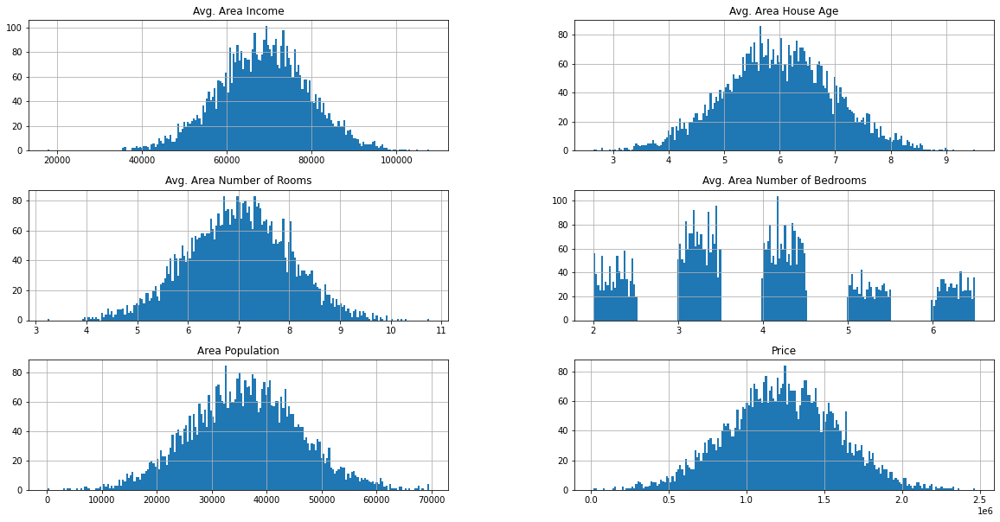

In [12]:
df.hist(bins=200,figsize=[20,10])

# Detecting Outliers using Boxplot

In [13]:
df.columns

Index(['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms',
       'Avg. Area Number of Bedrooms', 'Area Population', 'Price'],
      dtype='object')

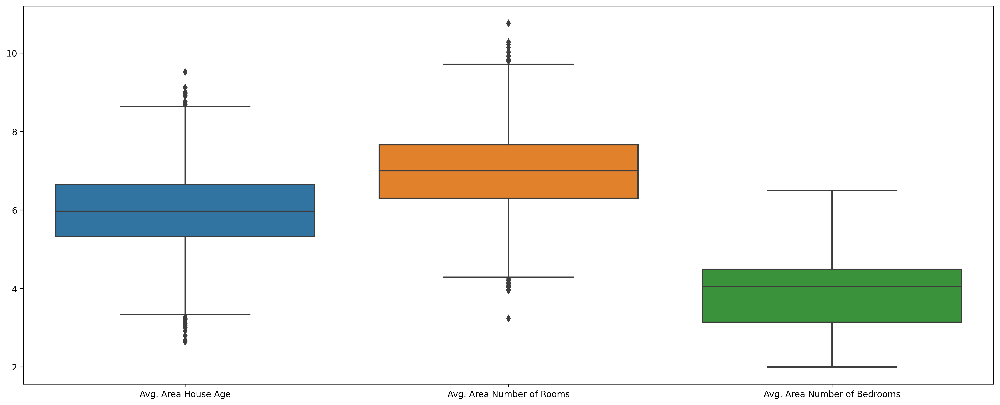

In [14]:

plt.figure(figsize=(20,8),dpi=400)
sns.boxplot(data=df[[ 'Avg. Area House Age', 'Avg. Area Number of Rooms','Avg. Area Number of Bedrooms']],orient='v')
plt.show()

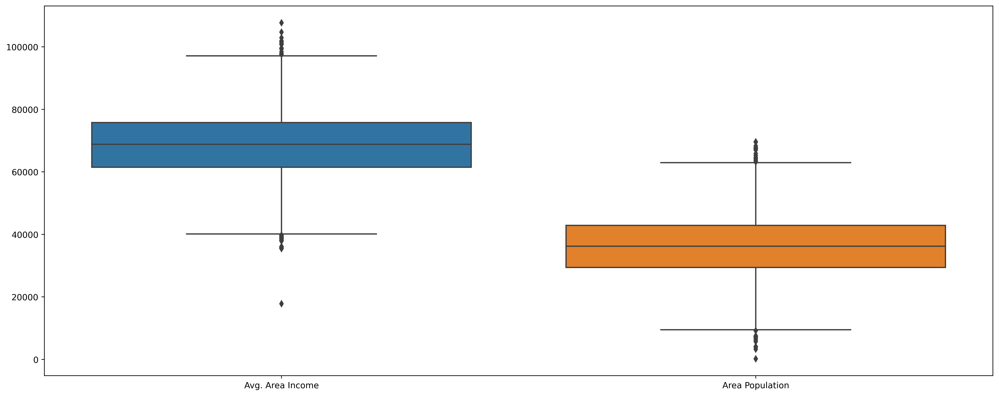

In [15]:

plt.figure(figsize=(20,8),dpi=400)
sns.boxplot(data=df[[ 'Avg. Area Income', 'Area Population']],orient='v')
plt.show()

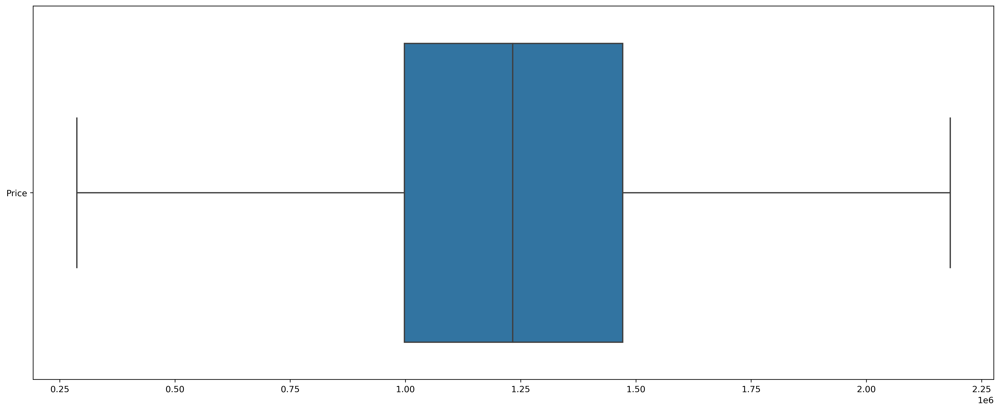

In [23]:
plt.figure(figsize=(20,8),dpi=400)
sns.boxplot(data=df[[ 'Price']],orient='h')
plt.show()

**Note**
Don't get confused about the outliers in the dataset as they are happenning due to exotic cars for special tasks with high performance so we will not be discarding them.



In [1]:
#pip install feature_engine

In [22]:
from feature_engine.outliers import Winsorizer
winsor = Winsorizer(capping_method='iqr', # choose  IQR rule boundaries or gaussian for mean and std
                          tail='both', # cap left, right or both tails 
                          fold=1.5,
                          variables=['Avg. Area House Age'])

df['Avg. Area House Age'] = winsor.fit_transform(df[['Avg. Area House Age']])

winsor = Winsorizer(capping_method='iqr', # choose  IQR rule boundaries or gaussian for mean and std
                          tail='both', # cap left, right or both tails 
                          fold=1.5,
                          variables=['Avg. Area Number of Rooms'])

df['Avg. Area Number of Rooms'] = winsor.fit_transform(df[['Avg. Area Number of Rooms']])

winsor = Winsorizer(capping_method='iqr', # choose  IQR rule boundaries or gaussian for mean and std
                          tail='both', # cap left, right or both tails 
                          fold=1.5,
                          variables=['Avg. Area Income'])

df['Avg. Area Income'] = winsor.fit_transform(df[['Avg. Area Income']])

winsor = Winsorizer(capping_method='iqr', # choose  IQR rule boundaries or gaussian for mean and std
                          tail='both', # cap left, right or both tails 
                          fold=1.5,
                          variables=['Area Population'])

df['Area Population'] = winsor.fit_transform(df[['Area Population']])

winsor = Winsorizer(capping_method='iqr', # choose  IQR rule boundaries or gaussian for mean and std
                          tail='both', # cap left, right or both tails 
                          fold=1.5,
                          variables=['Price'])

df['Price'] = winsor.fit_transform(df[['Price']])


# Boxplot after dealing with Outliers

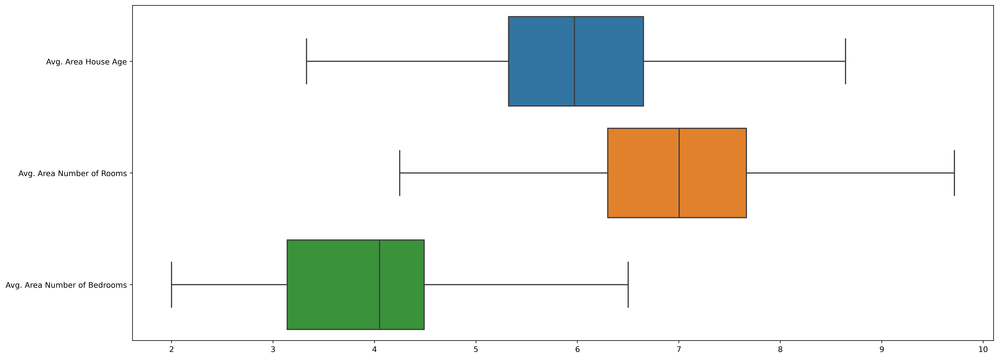

In [24]:
plt.figure(figsize=(20,8),dpi=400)
sns.boxplot(data=df[[ 'Avg. Area House Age', 'Avg. Area Number of Rooms','Avg. Area Number of Bedrooms']],orient='h')
plt.show()

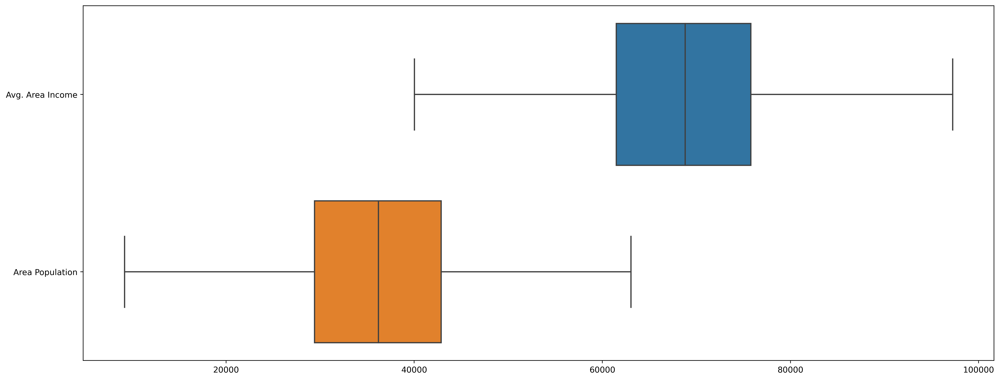

In [25]:
plt.figure(figsize=(20,8),dpi=400)
sns.boxplot(data=df[[ 'Avg. Area Income', 'Area Population']],orient='h')
plt.show()

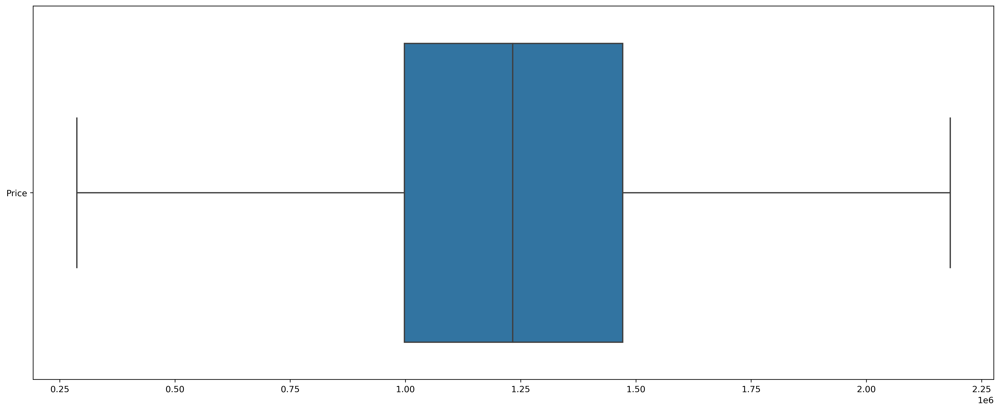

In [26]:
plt.figure(figsize=(20,8),dpi=400)
sns.boxplot(data=df[[ 'Price']],orient='h')
plt.show()

In [28]:
df.to_csv('without_csv.csv')

# Auto EDA and Visualisation

In [2]:
#pip install dataprep

  0%|          | 0/1213 [00:00<?, ?it/s]

bokeh.core.validation.check - ERROR - E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'Avg. Area Num...oms'


DataPrep Report
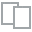
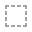
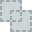
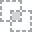
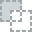
...
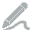
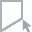
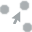
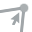
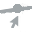

In [27]:
from dataprep.eda import create_report
create_report(df)

In [3]:
#pip install AutoViz


Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine
    max_rows_analyzed is smaller than dataset shape 5000...
        randomly sampled 2000 rows from read CSV file
Shape of your Data Set loaded: (2000, 7)
##########

,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Unnamed: 0,2000,int64,0,0.000000,100.000000,0,possible ID column: drop
Price,1995,float64,0,0.000000,99.750000,0,
Avg. Area House Age,1992,float64,0,0.000000,99.600000,0,
Avg. Area Number of Rooms,1992,float64,0,0.000000,99.600000,0,
Avg. Area Income,1989,float64,0,0.000000,99.450000,0,
Area Population,1988,float64,0,0.000000,99.400000,0,
Avg. Area Number of Bedrooms,254,float64,0,0.000000,12.700000,0,


  Printing upto 30 columns max in each category:
    Numeric Columns : ['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms', 'Avg. Area Number of Bedrooms', 'Area Population', 'Price']
    Integer-Categorical Columns: []
    String-Categorical Columns: []
    Factor-Categorical Columns: []
    String-Boolean Columns: []
    Numeric-Boolean Columns: []
    Discrete String Columns: []
    NLP text Columns: []
    Date Time Columns: []
    ID Columns: ['Unnamed: 0']
    Columns that will not be considered in modeling: []
    7 Predictors classified...
        1 variables removed since they were ID or low-information variables
        List of variables removed: ['Unnamed: 0']
Since Number of Rows in data 2000 exceeds maximum, randomly sampling 2000 rows for EDA...
   Columns to delete:
'   []'
   Boolean variables %s 
'   []'
   Categorical variables %s 
'   []'
   Continuous variables %s 
("   ['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms', "
 "

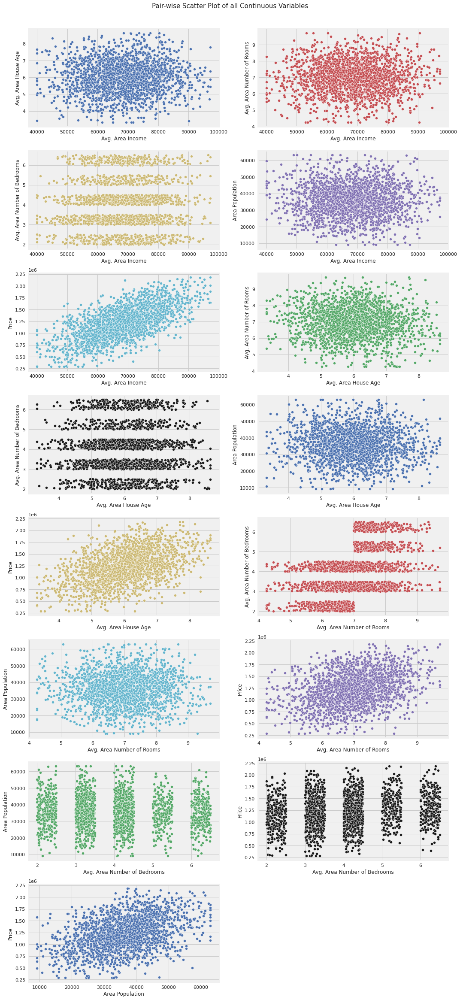

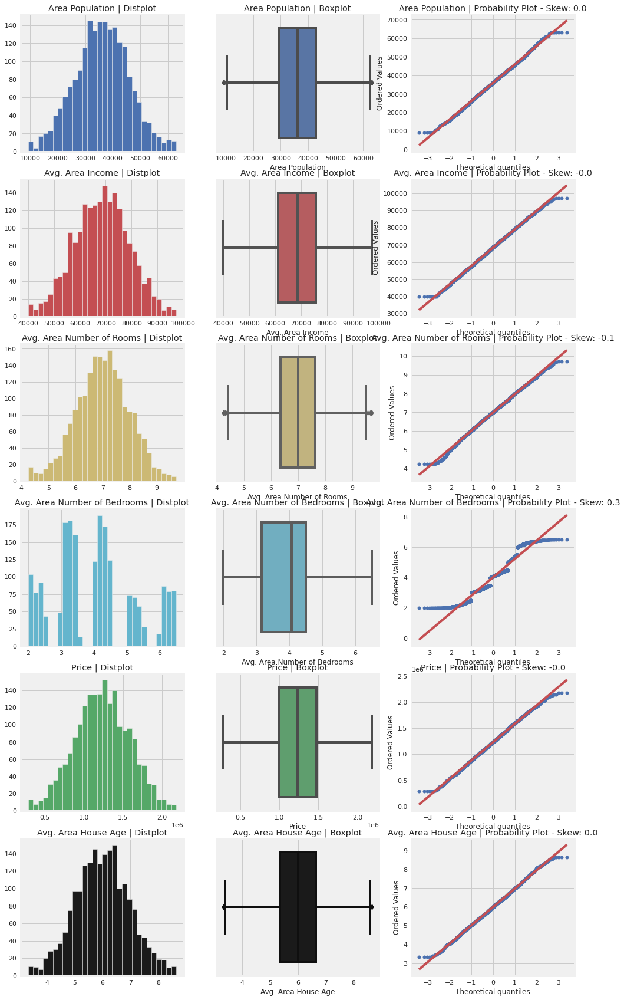

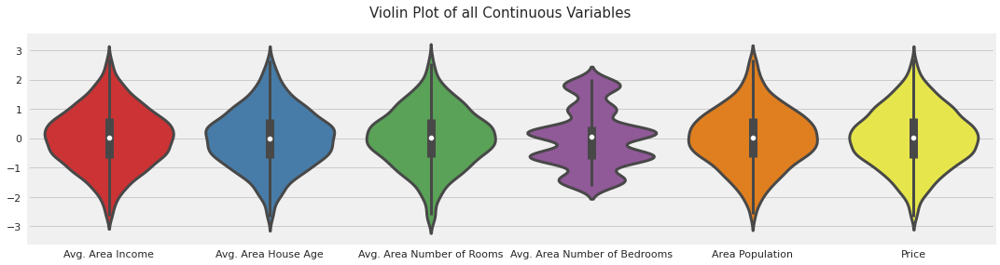

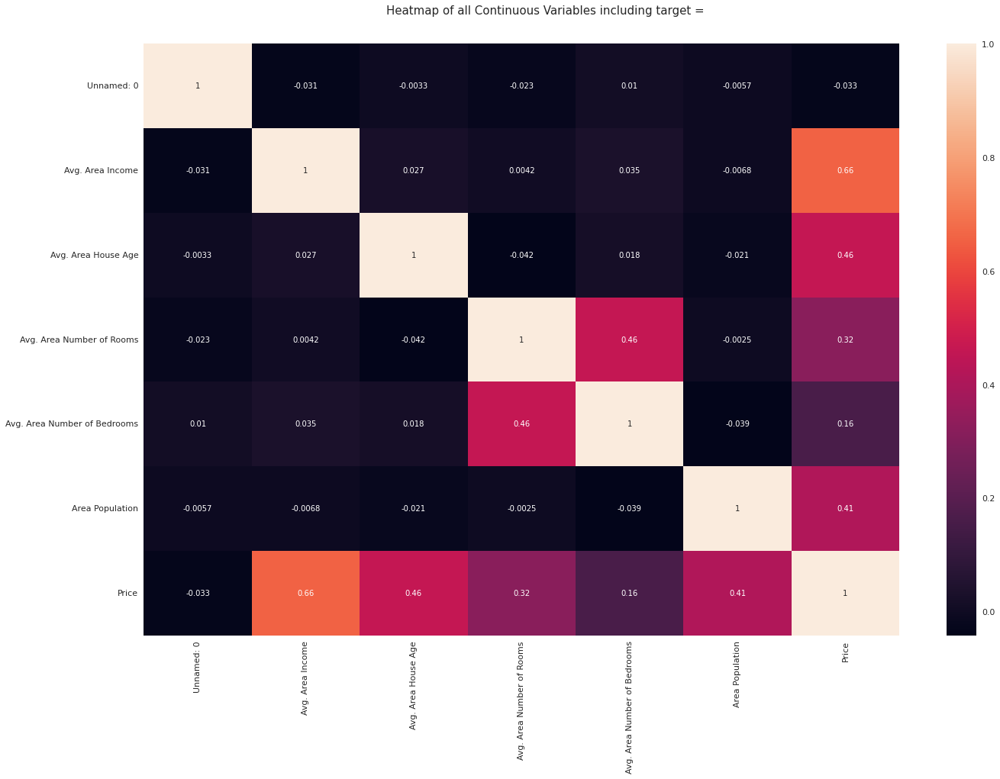

In [31]:

from autoviz.AutoViz_Class import AutoViz_Class   

AV = AutoViz_Class() #instantiaze the AV         

%matplotlib inline                               
filename = '/kaggle/working/without_csv.csv'
sep = ","
dft = AV.AutoViz(
    filename,
    sep=sep,
    depVar="",
    dfte=None,
    header=0,
    verbose=2,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=2000,
    max_cols_analyzed=20,
)

# Model Preparation

In [65]:
X = df.drop(['Price'],axis=1)
y = df['Price']
print(X.shape)

(5000, 5)


# scaling the data

In [34]:
from sklearn.preprocessing import StandardScaler
std = StandardScaler()

In [35]:
X = std.fit_transform(X)

In [36]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [37]:
# These will be used later for Model Comparision
names, mses, rmses, r2s = [], [], [], []


# Linear Regression

In [38]:
from sklearn.linear_model import LinearRegression

In [39]:
Mymodel1 = LinearRegression()

In [40]:
Mymodel1.fit(X_train,y_train)

LinearRegression()

In [41]:
pred1 = Mymodel1.predict(X_test)

In [42]:
# Performance Measure
lr_mse = mean_squared_error(y_test, pred1)
lr_rmse = np.sqrt(lr_mse)
lr_r2 = r2_score(y_test, pred1)

# Show Measures
result = '''
MSE  : {}
RMSE : {}
R^2  : {}
'''.format(lr_mse, lr_rmse, lr_r2)

print(result)

# Model Comparision 
names.append("Linear Regression")
mses.append(lr_mse)
rmses.append(lr_rmse)
r2s.append(lr_r2)


MSE  : 10141766848.330585
RMSE : 100706.33966305491
R^2  : 0.913302484308253



# ElasticNet Regression

In [43]:
elr = ElasticNet(alpha=0.1,random_state=42)
elr.fit(X_train,y_train)

#predict
pred = elr.predict(X_test)

In [44]:
# Performance Measure
elr_mse = mean_squared_error(y_test, pred)
elr_rmse = np.sqrt(lr_mse)
elr_r2 = r2_score(y_test, pred)

# Show Measures
result = '''
MSE  : {}
RMSE : {}
R^2  : {}
'''.format(lr_mse, lr_rmse, lr_r2)

print(result)

# Model Comparision 
names.append("elr")
mses.append(elr_mse)
rmses.append(elr_rmse)
r2s.append(elr_r2)


MSE  : 10141766848.330585
RMSE : 100706.33966305491
R^2  : 0.913302484308253



# Stochastic Gradient Descent

In [63]:
# Model
sgd = SGDRegressor()
sgd.fit(X_train, y_train)

# Prediction
pred2 = sgd.predict(X_test)

In [64]:
# Performance Measure
sgd_mse = mean_squared_error(y_test, pred2)
sgd_rmse = np.sqrt(lr_mse)
sgd_r2 = r2_score(y_test, pred2)

# Show Measures
result = '''
MSE  : {}
RMSE : {}
R^2  : {}
'''.format(lr_mse, lr_rmse, lr_r2)

print(result)

# Model Comparision 
names.append("SGDRegressor")
mses.append(sgd_mse)
rmses.append(sgd_rmse)
r2s.append(sgd_r2)


MSE  : 10141766848.330585
RMSE : 100706.33966305491
R^2  : 0.913302484308253



# Support Vector Regressor

In [47]:
# Model
svr = SVR(kernel='rbf')
svr.fit(X_train, y_train)

# Prediction
pred3 = svr.predict(X_test)

In [48]:
# Performance Measure
svr_mse = mean_squared_error(y_test, pred3)
svr_rmse = np.sqrt(lr_mse)
svr_r2 = r2_score(y_test, pred3)

# Show Measures
result = '''
MSE  : {}
RMSE : {}
R^2  : {}
'''.format(lr_mse, lr_rmse, lr_r2)

print(result)

# Model Comparision 
names.append("SVR")
mses.append(svr_mse)
rmses.append(svr_rmse)
r2s.append(svr_r2)


MSE  : 10141766848.330585
RMSE : 100706.33966305491
R^2  : 0.913302484308253



# Decision Tree Regressor

In [49]:
# Model
dtr = DecisionTreeRegressor(max_depth=5, random_state=42)
dtr.fit(X_train, y_train)

# Prediction
pred4 = dtr.predict(X_test)

In [50]:
# Performance Measure
dtr_mse = mean_squared_error(y_test, pred4)
dtr_rmse = np.sqrt(lr_mse)
dtr_r2 = r2_score(y_test, pred4)

# Show Measures
result = '''
MSE  : {}
RMSE : {}
R^2  : {}
'''.format(lr_mse, lr_rmse, lr_r2)

print(result)


# Model Comparision 
names.append("DTR")
mses.append(dtr_mse)
rmses.append(dtr_rmse)
r2s.append(dtr_r2)


MSE  : 10141766848.330585
RMSE : 100706.33966305491
R^2  : 0.913302484308253



# Random Forest Regressor

In [51]:
# Model
rfr = RandomForestRegressor(max_depth=10, random_state=42)
rfr.fit(X_train, y_train)

# Prediction
pred5 = rfr.predict(X_test)

In [52]:
# Performance Measure
rfr_mse = mean_squared_error(y_test, pred5)
rfr_rmse = np.sqrt(lr_mse)
rfr_r2 = r2_score(y_test, pred5)

# Show Measures
result = '''
MSE  : {}
RMSE : {}
R^2  : {}
'''.format(lr_mse, lr_rmse, lr_r2)

print(result)

# Model Comparision 
names.append("RFR")
mses.append(rfr_mse)
rmses.append(rfr_rmse)
r2s.append(rfr_r2)


MSE  : 10141766848.330585
RMSE : 100706.33966305491
R^2  : 0.913302484308253



# XGB Regression

In [53]:
from xgboost import XGBRegressor

In [54]:
xgb = XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)
xgb.fit(X_train,y_train)

#predict
pred6 = xgb.predict(X_test)

In [55]:
# Performance Measure
xgb_mse = mean_squared_error(y_test, pred5)
xgb_rmse = np.sqrt(lr_mse)
xgb_r2 = r2_score(y_test, pred5)

# Show Measures
result = '''
MSE  : {}
RMSE : {}
R^2  : {}
'''.format(lr_mse, lr_rmse, lr_r2)

print(result)

# Model Comparision 
names.append("xgb")
mses.append(xgb_mse)
rmses.append(xgb_rmse)
r2s.append(xgb_r2)


MSE  : 10141766848.330585
RMSE : 100706.33966305491
R^2  : 0.913302484308253



In [56]:
# MSE Plot
fig = px.bar(x=names, y=mses, color=names)
fig.update_layout({'title':{'text':"Mean Squared Error",'x':0.5}})
fig.show()

In [57]:
# RMSE Plot
fig = px.bar(x=names, y=rmses, color=names)
fig.update_layout({'title':{'text':"Root Mean Squared Error",'x':0.5}})
fig.show()

In [58]:
# R2 Plot
fig = px.bar(x=names, y=r2s, color=names)
fig.update_layout({'title':{'text':"$R^2$ Score",'x':0.5}})
fig.show()

# Final Model
**Choosing the final model with the best Accuracy(SGD Regressor)**

**Predictig the price using pickle**

In [67]:
# Model
sgd = SGDRegressor()
sgd.fit(X_train, y_train)

# Prediction
pickle.dump(rfr, open('model.pkl','wb'))

model = pickle.load(open('model.pkl','rb'))
print(model.predict([[79545,7,6,4,40173]]))

[2096380.73109622]
